# Analogous cycles experiments for three-to-one match
* The 3-to-1 match example data poses a challenge to the current analogous cycles method. 
* Includes variation of analogous bars method with a different choice of parameter for the witness complex

<mark>Finish writing</mark>

In [2]:
using Pkg
Pkg.activate("../env/.")
Pkg.instantiate()

  Activating project at `~/analogous_neural/env`


In [3]:
include("../src/analogous_bars.jl")
include("../src/Eirene_var.jl")

using .analogous_bars
using .Eirene_var


WebIO._IJuliaInit()

In [4]:
using DelimitedFiles
using Plots
using CSV
using Distances

# 1. Load data 

In [5]:
# load coordinates of point clouds
P = readdlm("data/three_to_one_match/set1/P.csv", ',', Float64)
Q = readdlm("data/three_to_one_match/set1/Q.csv", ',', Float64);

n_P = size(P, 1)
n_Q = size(Q, 1)

println("number of points in P: ", n_P)
println("number of points in Q: ", n_Q)

# Compute dissimilarity matrices 
PC_total = vcat(P, Q)
D = pairwise(Euclidean(), PC_total, dims=1)

D_P = D[1:n_P, 1:n_P]
D_Q = D[n_P+1:end, n_P+1:end]
D_PQ = D[1:n_P, n_P+1:end]
D_QP = Array(transpose(D_PQ))

println("Shape of D: ", size(D))
println("Shape of D1: ", size(D_P))
println("Shape of D2: ", size(D_Q))
println("Shape of D_cross: ", size(D_PQ))

number of points in P: 97
number of points in Q: 290
Shape of D: (387, 387)
Shape of D1: (97, 97)
Shape of D2: (290, 290)
Shape of D_cross: (97, 290)


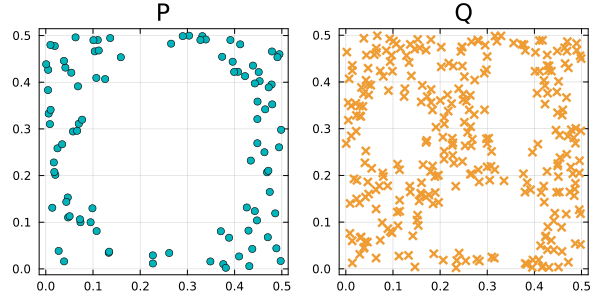

In [6]:
p1 = scatter(P[:,1], P[:,2], label = "", title = "P", frame = :box, c = "#00b4bc", titlefontsize = 16)
p2 = scatter(Q[:,1], Q[:,2], label = "", title = "Q", frame = :box, c = "#ee9c33",
     marker = :xcross, markerstrokewidth = 4, titlefontsize = 16)
p = plot(p1, p2, size = (600, 300))
#savefig("data/three_to_one_match/set1/pointclouds.pdf")
plot(p)


In [7]:
# compute persistence
VR_P = eirene(D_P, record = "all", maxdim = 1)
barcode_P = barcode(VR_P, dim = 1)

W = compute_Witness_persistence(D_PQ)
barcode_W = barcode(W["eirene_output"], dim = 1);

VR_Q = eirene(D_Q, record = "all", maxdim = 1)
barcode_Q = barcode(VR_Q, dim = 1);


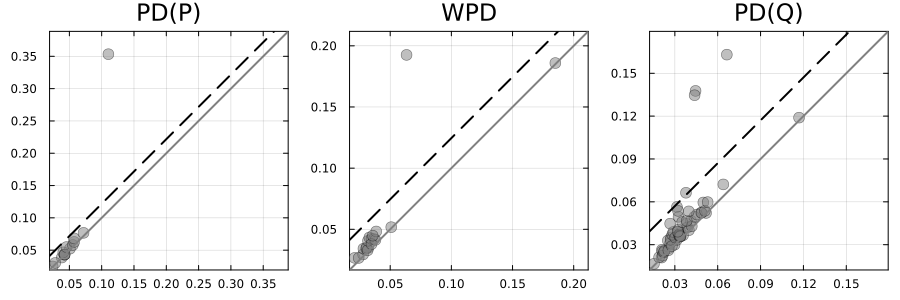

In [8]:
# plot PDs

selected_P, cutoff_P = select_persistent_intervals_IQR(barcode_P)
p1 = plot_PD(barcode_P; 
            cutoff = cutoff_P,  
            title = "PD(P)", 
            markersize = 6,
            titlefontsize = 16)

selected_W, cutoff_W = select_persistent_intervals_IQR(barcode_W)
p2 = plot_PD(barcode_W; 
            cutoff = cutoff_W, 
            title = "WPD", 
            markersize = 6,
            titlefontsize = 16)

selected_Q, cutoff_Q = select_persistent_intervals_IQR(barcode_Q)
p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)
p = plot(p1, p2, p3, layout = grid(1,3), size = (900, 300))
#savefig("data/three_to_one_match/set1/PDs.pdf")
plot(p)


# 2. Analogous cycles (default method)

In [9]:
println("Selected Witness point: ", selected_W)
W_idx = selected_W[1]

Selected Witness point: [19]


19

In [19]:
analogous_P, analogous_Q, _ = analogous_bars.run_baseline_similarity_analogous(VR_P = VR_P,
                                                                    D_P = D_P,
                                                                    VR_Q = VR_Q,
                                                                    D_Q = D_Q,
                                                                    W_PQ = W,
                                                                    W_PQ_bars = selected_W,
                                                                    dim = 1);

In [20]:
analogous_P[W_idx]

Dict{Any, Any} with 10 entries:
  "aux_filt_cyclerep"      => Dict{Any, Any}("Fbar_rep_tau"=>[[22, 73], [33, 73…
  "comparison"             => "W to VR"
  "epsilon_0"              => 0.110379
  "p_Y"                    => [0.110379]
  "C_VR"                   => Dict{String, Any}("symmat"=>[4054 3487 … 1244 0; …
  "dim"                    => 1
  "C_W"                    => Dict{String, Any}("rv"=>Any[Int64[], [1, 2, 1, 3,…
  "selected_cycle"         => [[7, 18], [31, 57], [28, 54], [8, 15], [29, 85], …
  "baseline_bar_extension" => [13]
  "C_auxiliary_filtration" => Dict{String, Any}("rv"=>Any[Int64[], [1, 3, 1, 4,…

In [21]:
analogous_Q[W_idx]

Dict{Any, Any} with 10 entries:
  "aux_filt_cyclerep"      => Dict{Any, Any}(56=>[[43, 151], [246, 258], [151, …
  "comparison"             => "W to VR"
  "epsilon_0"              => 0.0322356
  "p_Y"                    => [0.0322356, 0.0323644, 0.0325629, 0.0328851, 0.03…
  "C_VR"                   => Dict{String, Any}("symmat"=>[28541 28127 … 1413 1…
  "dim"                    => 1
  "C_W"                    => Dict{String, Any}("rv"=>Any[Int64[], [1, 2, 1, 3,…
  "selected_cycle"         => [[107, 176], [159, 228], [69, 94], [94, 148], [19…
  "baseline_bar_extension" => [52]
  "C_auxiliary_filtration" => Dict{String, Any}("rv"=>Any[Int64[], [1, 2, 1, 3,…

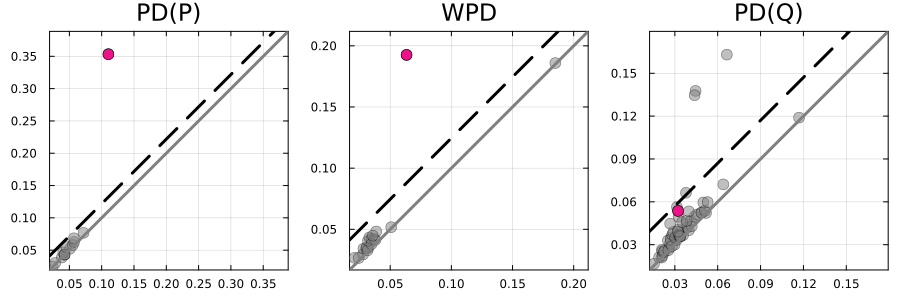

In [24]:
# plot similarity-centric analogous pairs 

p1 = plot_PD(barcode_P; 
            cutoff = cutoff_P,  
            title = "PD(P)", 
            highlight = analogous_P[W_idx]["baseline_bar_extension"],
            markersize = 6,
            titlefontsize = 16)

p2 = plot_PD(barcode_W; 
            cutoff = cutoff_W, 
            title = "WPD", 
            highlight = [W_idx],
            markersize = 6,
            titlefontsize = 16)

p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            title = "PD(Q)", 
            highlight = analogous_Q[W_idx]["baseline_bar_extension"],
            markersize = 6,
            titlefontsize = 16)
p = plot(p1, p2, p3, layout = grid(1,3), size = (900, 300))
#savefig("data/three_to_one_match/set1/analogous_cycles.pdf")
plot(p)

Plot cycle reps of identified points

In [27]:
println("Analogous point in P: ", analogous_P[witness_idx]["baseline_bar_extension"])
println("Analogous point in Q: ", analogous_Q[witness_idx]["baseline_bar_extension"])

Analogous point in P: [13]
Analogous point in Q: [52]


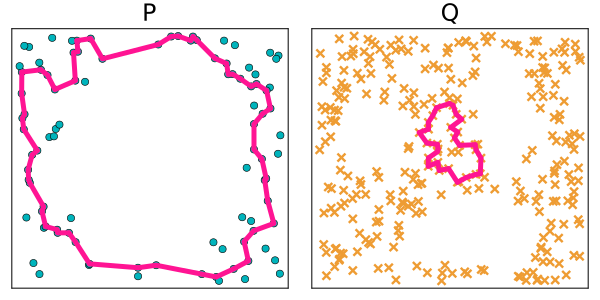

In [49]:
# select baseline cycle extension in P
cr_P = get_cyclerep_Eirene(VR_P, 13)
cr_Q = get_cyclerep_Eirene(VR_Q, 52);

p1 = plot_cycle_single(transpose(P), cycle = cr_P, cycle_color = :deeppink, c = "#00b4bc", cycle_loc = "P"; title = "P", titlefontsize = 16, legend = false)
p2 = plot_cycle_single(transpose(Q), cycle = cr_Q, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
                        title = "Q", titlefontsize = 16, legend = false,
                        marker = :xcross,
                        markerstrokewidth = 4)

p = plot(p1, p2, layout = grid(1,2), size = (600, 300))
#savefig("data/ambiguous_match/set1/analogous_pair_cyclerep.pdf")
plot(p)

# 3. Variation of analogous cycles:  with user-specific choice of Witness complex parameter

## 3(a) Witness parameter: birth parameter of the Witness cycle

In [31]:
W_birth, W_death = barcode_W[W_idx,:]
println("Birth time of Witness cycle: ", W_birth)
println("Death time of Witness cycle: ", W_death);

Birth time of Witness cycle: 0.06337917939067425
Death time of Witness cycle: 0.19255654430597458


In [34]:
# run analogous cycles 
analogous_P_birthtime, analogous_Q_birthtime = analogous_bars.run_baseline_similarity_analogous_param(
                                                                                                VR_P = VR_P,
                                                                                                D_P = D_P,
                                                                                                VR_Q = VR_Q,
                                                                                                D_Q = D_Q,
                                                                                                W_PQ = W,
                                                                                                W_PQ_bar = W_idx,
                                                                                                W_param = W_birth
                                                                                                );

extension to P complete.
computed dual Witness filtration.
extension to Q complete.


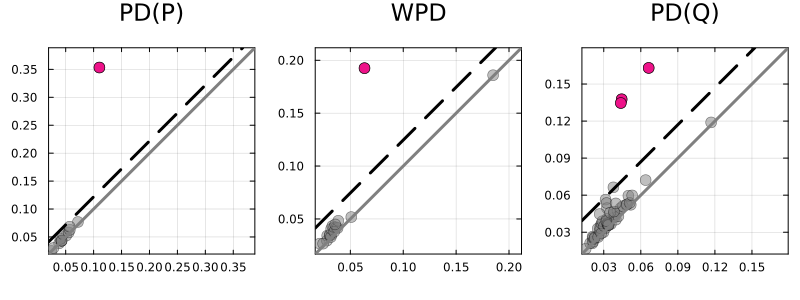

In [42]:
# plot similarity-centric analogous pairs 

# plot all persistence diagrams & significance feature cutoff
p1 = plot_PD(barcode_P; 
            cutoff = cutoff_P,  
            highlight = analogous_P_birthtime["baseline_bar_extension"],
            title = "PD(P)", 
            markersize = 6,
            titlefontsize = 16)

p2 = plot_PD(barcode_W; 
            cutoff = cutoff_W, 
            highlight = [witness_idx],
            title = "WPD", 
            markersize = 6,
            titlefontsize = 16)

p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = analogous_Q_birthtime["baseline_bar_extension"],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p = plot(p1, p2, p3, layout = grid(1,3), size = (800, 300))
#savefig("data/three_to_one_match/set1/analogous_cycles_birthtime.pdf")
plot(p)

## 3(b) Witness parameter: 
* Immediately prior to the smallest death parameter of all significant VR-points

In [12]:
min_total = analogous_bars.find_min_death_param(barcode_P, [13], barcode_Q, [42, 49, 57])

0.13463740558321327

In [12]:
# run analogous cycles, slightly before the identified min_total
analogous_P_mindeath, analogous_Q_mindeath = analogous_bars.run_baseline_similarity_analogous_param(
                                                                                                VR_P = VR_P,
                                                                                                D_P = D_P,
                                                                                                VR_Q = VR_Q,
                                                                                                D_Q = D_Q,
                                                                                                W_PQ = W,
                                                                                                W_PQ_bar = W_idx,
                                                                                                W_param = min_total * 0.99
                                                                                                );

extension to P complete.
computed dual Witness filtration.
extension to Q complete.


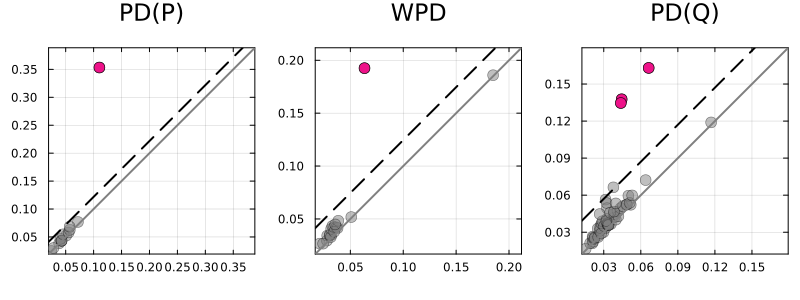

In [14]:
# plot all persistence diagrams & significance feature cutoff
p1 = plot_PD(barcode_P; 
            cutoff = cutoff_P,  
            highlight = analogous_P_mindeath["baseline_bar_extension"],
            title = "PD(P)", 
            markersize = 6,
            titlefontsize = 16)

p2 = plot_PD(barcode_W; 
            cutoff = cutoff_W, 
            highlight = [W_idx],
            title = "WPD", 
            markersize = 6,
            titlefontsize = 16)

p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = analogous_Q_mindeath["baseline_bar_extension"],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p = plot(p1, p2, p3, layout = grid(1,3), size = (800, 300))
#savefig("data/three_to_one_match/set1/analogous_cycles_mindeath.pdf")
plot(p)

In [15]:
println("Analogous cycle(s) in P: ", analogous_P_mindeath["baseline_bar_extension"])
println("Analogous cycle(s) in Q: ", analogous_Q_mindeath["baseline_bar_extension"])

Analogous cycle(s) in P: [13]
Analogous cycle(s) in Q: [49, 42, 57]


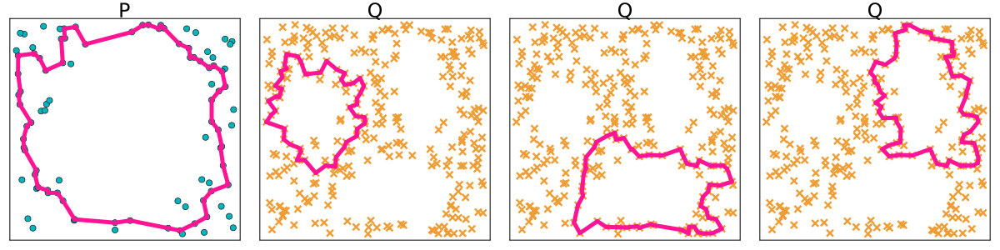

In [48]:
# select baseline cycle extension in P
cr_P = get_cyclerep_Eirene(VR_P, 13)
cr_Q1 = get_cyclerep_Eirene(VR_Q, 42)
cr_Q2 = get_cyclerep_Eirene(VR_Q, 49)
cr_Q3 = get_cyclerep_Eirene(VR_Q, 57)

p1 = plot_cycle_single(transpose(P), cycle = cr_P, cycle_color = :deeppink, c = "#00b4bc", cycle_loc = "P"; title = "P", titlefontsize = 16, legend = false)
p2 = plot_cycle_single(transpose(Q), cycle = cr_Q1, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
                        title = "Q", titlefontsize = 16, legend = false,
                        marker = :xcross,
                        markerstrokewidth = 4)
p3 = plot_cycle_single(transpose(Q), cycle = cr_Q2, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
title = "Q", titlefontsize = 16, legend = false,
marker = :xcross,
markerstrokewidth = 4)

p4 = plot_cycle_single(transpose(Q), cycle = cr_Q3, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
title = "Q", titlefontsize = 16, legend = false,
marker = :xcross,
markerstrokewidth = 4)

p = plot(p1, p2, p3, p4, layout = grid(1,4), size = (1200, 300))
#savefig("data/three_to_one_match/set1/mindeath_analogous_pair_cyclerep.pdf")
plot(p)

# 4. Full analogous cycles

In [10]:
println("Selected Witness point: ", selected_W)
W_idx = selected_W[1]

Selected Witness point: [19]


19

In [11]:
analogous_P_full, analogous_Q_full = run_similarity_analogous(VR_P = VR_P,
                                                            D_P = D_P,
                                                            VR_Q = VR_Q,
                                                            D_Q = D_Q,
                                                            W_PQ = W,
                                                            W_PQ_bar = W_idx);

Extension to P complete.
computed dual Witness filtration.
Extension to Q complete.


In [41]:
analogous = organize_baseline_offset_extensions(
                                                analogous_P_full,
                                                selected_P,
                                                analogous_Q_full,
                                                selected_Q,
                                                )

Dict{Any, Any} with 4 entries:
  "P_baseline" => [13]
  "Q_baseline" => Int64[]
  "Q_offset"   => [[49], [57], [42], [54]]
  "P_offset"   => Any[]

Plot the baseline and offset analogous cycles

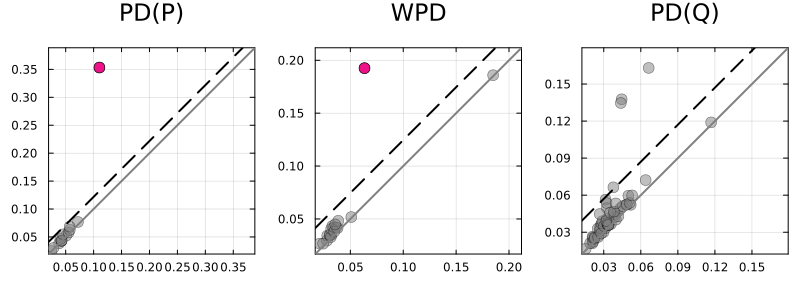

In [42]:
p1 = plot_PD(barcode_P; 
            cutoff = cutoff_P,  
            highlight = analogous["P_baseline"],
            title = "PD(P)", 
            markersize = 6,
            titlefontsize = 16)

p2 = plot_PD(barcode_W; 
            cutoff = cutoff_W, 
            highlight = [W_idx],
            title = "WPD", 
            markersize = 6,
            titlefontsize = 16)

p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = analogous["Q_baseline"],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p = plot(p1, p2, p3, layout = grid(1,3), size = (800, 300))
#savefig("data/three_to_one_match/set1/analogous_cycles_baseline.pdf")
plot(p)


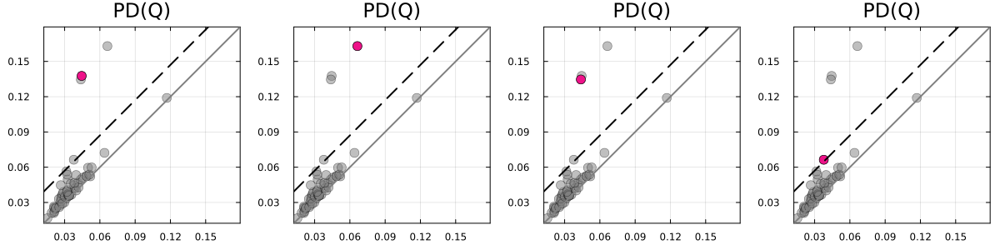

In [47]:
p1 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = [42],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p2 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = [49],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p3 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = [57],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p4 = plot_PD(barcode_Q; 
            cutoff = cutoff_Q, 
            highlight = [54],
            title = "PD(Q)", 
            markersize = 6,
            titlefontsize = 16)

p = plot(p1, p2, p3, p4, layout = grid(1, 4), size = (1200, 300))
#savefig("data/three_to_one_match/set1/analogous_cycles_offset_Q.pdf")
plot(p)


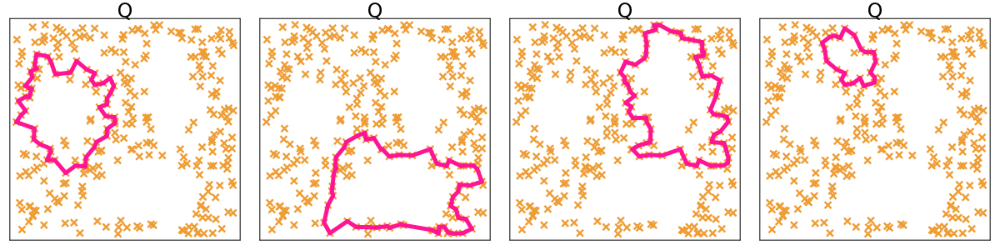

In [49]:
# plot the four cycle representatives

# select baseline cycle extension in P

cr_Q1 = get_cyclerep_Eirene(VR_Q, 42)
cr_Q2 = get_cyclerep_Eirene(VR_Q, 49)
cr_Q3 = get_cyclerep_Eirene(VR_Q, 57)
cr_Q4 = get_cyclerep_Eirene(VR_Q, 54)


p1 = plot_cycle_single(transpose(Q), cycle = cr_Q1, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
                        title = "Q", titlefontsize = 16, legend = false,
                        marker = :xcross,
                        markerstrokewidth = 4)
p2 = plot_cycle_single(transpose(Q), cycle = cr_Q2, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
title = "Q", titlefontsize = 16, legend = false,
marker = :xcross,
markerstrokewidth = 4)

p3 = plot_cycle_single(transpose(Q), cycle = cr_Q3, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
title = "Q", titlefontsize = 16, legend = false,
marker = :xcross,
markerstrokewidth = 4)

p4 = plot_cycle_single(transpose(Q), cycle = cr_Q4, cycle_color = :deeppink, c = "#ee9c33", cycle_loc = "Q"; 
title = "Q", titlefontsize = 16, legend = false,
marker = :xcross,
markerstrokewidth = 4)

p = plot(p1, p2, p3, p4, layout = grid(1,4), size = (1200, 300))
#savefig("data/three_to_one_match/set1/offset_Q_cyclerep.pdf")
plot(p)

# Plot Witness cycles

In [54]:
W_PQ = W 

# find death parameter of selected Witness cycle
W_death_param = analogous_bars.find_max_death_param(barcode_W, [W_idx])

# compute the dual
W_QP, P_to_Q = analogous_bars.compute_Dowker_dual(W_PQ, param_max = W_death_param)
W_QP_idx = P_to_Q[W_idx]

# find cycle, psi in W_P and W_Q
cycle_W_P, _ =  analogous_bars.find_terminal_class_in_W(W_PQ, bar = W_idx)

cycle_W_P = analogous_bars.find_classrep_in_W(W_PQ, bar = W_idx)
cycle_W_Q = analogous_bars.find_classrep_in_W(W_QP, bar = W_QP_idx);

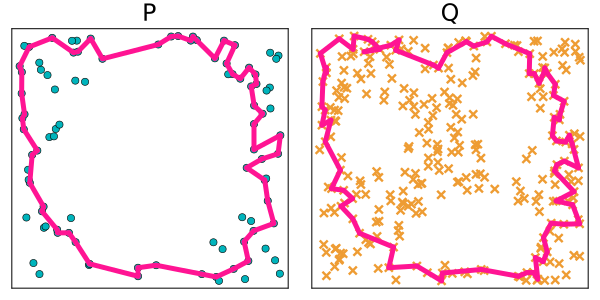

In [56]:
# plot Witness cycles 
p1 = plot_cycle_single(transpose(P), cycle = cycle_W_P, cycle_color = :deeppink, c = "#00b4bc", title = "P", titlefontsize = 16)
p2 = plot_cycle_single(transpose(Q), cycle = cycle_W_Q, cycle_color = :deeppink, c = "#ee9c33", title = "Q", titlefontsize = 16,
                    marker = :xcross,
                    markerstrokewidth = 4)
p = plot(p1, p2, layout = grid(1,2), size = (600, 300))
#savefig("data/ambiguous_match/set1/Witness_cycles.pdf")
plot(p)

# Plot Witness complexes

Plot Witness complexes near the birth time of the Witness cycle

In [ ]:
param = 0.064
p1 = plot_Dowker_complex(D_PQ, param, P, show_2simplex = true, sample_proportion = 0.7, c =  "#00b4bc")

# plot on PC2
p2 = plot_Dowker_complex(D_QP, param, Q; show_2simplex = true, 
                                sample_proportion = 0.4,
                                markershape = :xcross, 
                                markerstrokewidth = 4, 
                                c =   "#ee9c33")
p = plot(p1, p2, size = (600, 300))

#savefig("data/ambiguous_match/set1/Witness_complexes_birthparam.png")
plot(p)


Plot Witness complexes near the min death param

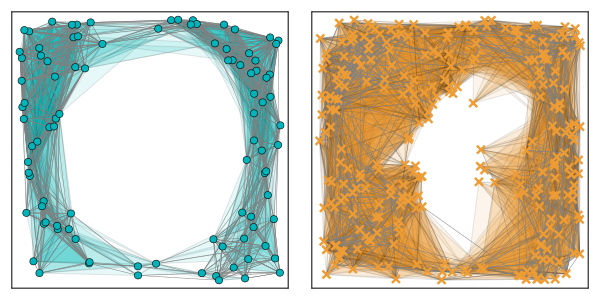

In [18]:
param = min_total * 0.99
p1 = plot_Dowker_complex(D_PQ, param, P, show_2simplex = true, sample_proportion = 0.03, c =  "#00b4bc")

# plot on PC2
p2 = plot_Dowker_complex(D_QP, param, Q; show_2simplex = true, 
                                sample_proportion = 0.01,
                                markershape = :xcross, 
                                markerstrokewidth = 4, 
                                c =   "#ee9c33")
p = plot(p1, p2, size = (600, 300))

#savefig("data/three_to_one_match/set1/Witness_complexes_mindeath.png")
plot(p)

Plot Witness complexes at the very last death param (default)

In [20]:
# find death parameter of selected Witness cycle
W_death_param = analogous_bars.find_max_death_param(barcode_W, [W_idx])

0.19255654430597458

In [ ]:
param = 0.18
p1 = plot_Dowker_complex(D_PQ, param, P, show_2simplex = true, sample_proportion = 0.02, c =  "#00b4bc")

# plot on PC2
p2 = plot_Dowker_complex(D_QP, param, Q; show_2simplex = true, 
                                sample_proportion = 0.001,
                                markershape = :xcross, 
                                markerstrokewidth = 4, 
                                c =   "#ee9c33")
p = plot(p1, p2, size = (600, 300))

#savefig("data/three_to_one_match/set1/Witness_complexes_death.png")
plot(p)